# Métodos de agrupamiento

## Algoritmo de agrupamiento DBSCAN

In [5]:
import pandas as pd
from google.colab import files

# Métodos de agrupamiento
# Algoritmos de agrupamiento por k-medias.

# Cargue del conjunto de datos
uploaded = files.upload()
datos = pd.read_excel("Fish.xlsx")

print(datos.head())
print(datos.shape)

Saving Fish.xlsx to Fish (2).xlsx
  Species  Weight  Length1  Length2  Length3   Height   Width
0   Bream   242.0     23.2     25.4     30.0  11.5200  4.0200
1   Bream   290.0     24.0     26.3     31.2  12.4800  4.3056
2   Bream   340.0     23.9     26.5     31.1  12.3778  4.6961
3   Bream   363.0     26.3     29.0     33.5  12.7300  4.4555
4   Bream   430.0     26.5     29.0     34.0  12.4440  5.1340
(159, 7)


In [6]:
# Variable Species, solo para comparar
species = datos["Species"].astype("category")

species.head()

,Species
0,Bream
1,Bream
2,Bream
3,Bream
4,Bream


In [7]:
# Variables numéricas estandarizadas
datos = datos.loc[:, "Weight":"Width"].copy()
datos = (datos - datos.mean()) / datos.std(ddof=1)

datos.head()

,Weight,Length1,Length2,Length3,Height,Width
0,-0.436692,-0.304825,-0.281414,-0.105686,0.594700,-0.235784
1,-0.302606,-0.224797,-0.197430,-0.002329,0.818674,-0.066369
2,-0.162933,-0.234801,-0.178767,-0.010942,0.794830,0.165271
3,-0.098683,0.005285,0.054522,0.195772,0.877001,0.022550
4,0.088479,0.025292,0.054522,0.238837,0.810275,0.425028


In [8]:
import numpy as np
import plotly.graph_objects as go

# Densidad bivariada
x, y = datos["Length1"].to_numpy(), datos["Length3"].to_numpy()
gx, gy = np.linspace(x.min(), x.max(), 515), np.linspace(y.min(), y.max(), 515)

hx = 1.06 * min(x.std(ddof=1), (np.quantile(x, .75) - np.quantile(x, .25)) / 1.34) * len(x)**(-1/5)
hy = 1.06 * min(y.std(ddof=1), (np.quantile(y, .75) - np.quantile(y, .25)) / 1.34) * len(y)**(-1/5)

Kx = np.exp(-0.5 * ((gx[:, None] - x[None, :]) / hx)**2) / np.sqrt(2*np.pi)
Ky = np.exp(-0.5 * ((gy[:, None] - y[None, :]) / hy)**2) / np.sqrt(2*np.pi)
z = (Kx @ Ky.T) / (len(x) * hx * hy)

go.Figure(go.Contour(x=gx, y=gy, z=z.T, contours_coloring="heatmap")).show()

In [9]:
go.Figure(go.Surface(x=gx, y=gy, z=z.T)).show()

In [10]:
from sklearn.metrics import pairwise_distances

# Distancia
D = pairwise_distances(datos, metric="euclidean") # datos debe estar estandarizado
np.fill_diagonal(D, 0)

D

array([[0.        , 0.34782967, 0.5479579 , ..., 3.50282228, 3.08157659,
        3.04151131],
       [0.34782967, 0.        , 0.27250123, ..., 3.83991815, 3.41722672,
        3.38011251],
       [0.5479579 , 0.27250123, 0.        , ..., 3.96954743, 3.53090891,
        3.5024928 ],
       ...,
       [3.50282228, 3.83991815, 3.96954743, ..., 0.        , 0.54109956,
        0.51677802],
       [3.08157659, 3.41722672, 3.53090891, ..., 0.54109956, 0.        ,
        0.16708341],
       [3.04151131, 3.38011251, 3.5024928 , ..., 0.51677802, 0.16708341,
        0.        ]])

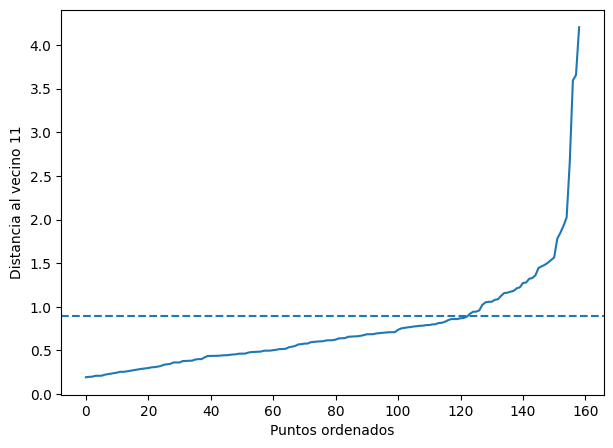

In [11]:
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt

# Determinación de los hiperparámetros
p = datos.shape[1] ; p
MinPts = 2*p # > p y recomendado 2p. Mínimo número de puntos en el vecindario para ser núcleo

kdist = np.sort(D, axis=1)[:, MinPts - 1]
kdist = np.sort(kdist)

eps = 0.9 # radio de vecindad (hay que calibrarlo)

plt.figure(figsize=(7, 5))
plt.plot(kdist)
plt.axhline(y=eps, linestyle="--")
plt.xlabel("Puntos ordenados")
plt.ylabel(f"Distancia al vecino {MinPts - 1}")
plt.show()

In [12]:
# Agrupamiendo con DBSCAN
ag_dbs = DBSCAN(
    eps=eps,
    min_samples=MinPts,
    metric="precomputed"
).fit(D)

# Asignación de los individuos a los grupos
grupos = np.where(ag_dbs.labels_ == -1, 0, ag_dbs.labels_ + 1)

print(grupos) # 0 indica atípico o ruido
pd.Series(grupos).value_counts().sort_index()

[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1
 1 1 1 1 1 1 1 1 1 1 1]


,count
0,20
1,119
2,20


In [13]:
# !pip install hdbscan

from hdbscan.validity import validity_index

# Validación: índice DBCV, debe ser positivo
if np.sum(pd.Series(grupos).astype(str).unique() != "0") >= 2:
    val = validity_index(
        datos.to_numpy(),
        ag_dbs.labels_,
        metric="euclidean",
        d=datos.shape[1]
    )
print(val)

0.22255531229115302


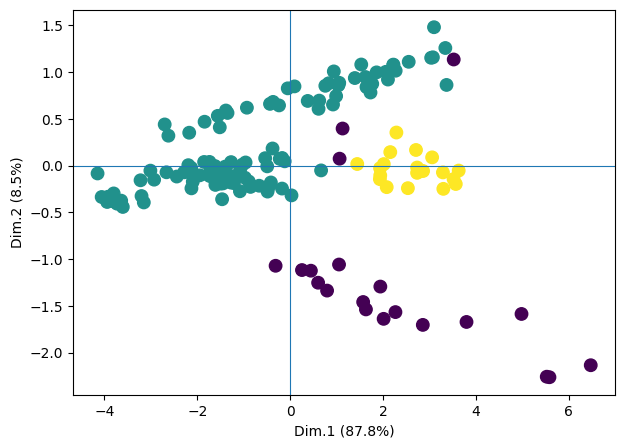

In [15]:
from sklearn.decomposition import PCA

# Representación gráfica sobre un ACP
acp = PCA(n_components=2)
coord = acp.fit_transform(datos)

plt.figure(figsize=(7, 5))
plt.scatter(
    coord[:, 0],
    coord[:, 1],
    c=grupos,
    s=80
)

plt.axhline(0, linewidth=0.8)
plt.axvline(0, linewidth=0.8)
plt.xlabel(f"Dim.1 ({acp.explained_variance_ratio_[0] * 100:.1f}%)")
plt.ylabel(f"Dim.2 ({acp.explained_variance_ratio_[1] * 100:.1f}%)")
plt.title("")
plt.show()

In [16]:
from sklearn.metrics import adjusted_rand_score

# Simulación para obtener los hiperparámetros

# Distancia
D = pairwise_distances(datos, metric="euclidean") # datos debe estar estandarizado
np.fill_diagonal(D, 0)
Dmat = D.copy()

# Grilla de parámetros
p = datos.shape[1]
grid = pd.DataFrame(
    [(eps, MinPts)
     for eps in np.round(np.arange(0.5, 1.5 + 0.001, 0.05), 2)
     for MinPts in range(p + 1, 3*p + 1)],
    columns=["eps", "MinPts"]
)

# Función para calcular DBCV sin errores
def calc_dbcv(datos, labels, grupos, p):
    k = np.sum(pd.Series(grupos).astype(str).unique() != "0") # núm. de grupos (sin ruido)

    if k < 2:
        return np.nan

    try:
        return validity_index(
            datos.to_numpy(),
            labels,
            metric="euclidean",
            d=p
        )
    except:
        return np.nan

# Función que calcula la estabilidad por submuestreo con ARI
# comparando con grupos iniciales del dbscan sobre la muestra.
# Se selecciona el p*100% de la muestra en cada una de las B muestras
def calc_ari(Dmat, grupos_base, eps, MinPts, B=100, prop=0.80):
    n = len(grupos_base)
    ari = np.empty(B)

    for b in range(B):
        id_ = np.random.choice(np.arange(n), size=int(np.floor(prop*n)), replace=False)
        D_b = Dmat[np.ix_(id_, id_)]

        ag_b = DBSCAN(
            eps=eps,
            min_samples=MinPts,
            metric="precomputed"
        ).fit(D_b)

        grupos_b = np.where(ag_b.labels_ == -1, 0, ag_b.labels_ + 1)

        ari[b] = adjusted_rand_score(grupos_base[id_], grupos_b) # ARI

    return np.nanmean(ari) # ARI promedio sobre las B muestras

# Evaluación de la grilla
np.random.seed(123)

res = grid.copy()
res["dbcv"] = np.nan
res["k"] = np.nan
res["ruido"] = np.nan
res["ari"] = np.nan

for i in range(len(grid)):
    ag = DBSCAN(
        eps=grid.loc[i, "eps"],
        min_samples=int(grid.loc[i, "MinPts"]),
        metric="precomputed"
    ).fit(D)

    grupos = np.where(ag.labels_ == -1, 0, ag.labels_ + 1)

    res.loc[i, "k"] = np.sum(pd.Series(grupos).astype(str).unique() != "0")
    res.loc[i, "ruido"] = np.mean(grupos == 0)*100 # porcentaje de ruido
    res.loc[i, "dbcv"] = calc_dbcv(datos, ag.labels_, grupos, p)

    if res.loc[i, "k"] >= 2:
        res.loc[i, "ari"] = calc_ari(
            Dmat=Dmat,
            grupos_base=grupos,
            eps=grid.loc[i, "eps"],
            MinPts=int(grid.loc[i, "MinPts"]),
            B=100,
            prop=0.80
        )

# Ordenar por DBCV
# res = res.sort_values("dbcv", ascending=False)
res = res[res["k"] > 2]
res.sort_values(["ruido", "dbcv", "ari"], ascending=[True, False, False])

,eps,MinPts,dbcv,k,ruido,ari
5,0.50,12,0.416457,3.0,45.911950,0.647006
6,0.50,13,0.402980,3.0,48.427673,0.527990
1,0.50,8,0.381012,3.0,40.880503,0.953982
2,0.50,9,0.381012,3.0,40.880503,0.894056
0,0.50,7,0.354327,3.0,38.993711,0.943004
17,0.55,12,0.353600,3.0,42.767296,0.795329
18,0.55,13,0.353600,3.0,42.767296,0.610242
12,0.55,7,0.350369,4.0,20.754717,0.681239
19,0.55,14,0.337041,3.0,45.911950,0.582679
51,0.70,10,0.324236,4.0,18.238994,0.852970


In [18]:
# Agrupamiento seleccionado

MinPts = 7
eps = 0.85

ag_dbs = DBSCAN(
    eps=eps,
    min_samples=MinPts,
    metric="precomputed"
).fit(D)

ag_dbs.core_sample_indices_ # seed -> nucleo

grupos = np.where(ag_dbs.labels_ == -1, 0, ag_dbs.labels_ + 1)

print(grupos) # 0 indica atípico o ruido
pd.Series(grupos).value_counts().sort_index()

[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 3 3 3 3 3 3 3 3 3 3 0 0 0 0 0 0 1 1 1
 1 1 1 1 1 1 1 1 1 1 1]


,count
0,7
1,120
2,22
3,10


In [19]:
# Comparando con Species
pd.crosstab(
    pd.Series(grupos, name="grupos"),
    pd.Series(species, name="species")
)

species,Bream,Parkki,Perch,Pike,Roach,Smelt,Whitefish
grupos,,,,,,,
0,0,0,0,7,0,0,0
1,35,11,37,0,20,14,3
2,0,0,19,0,0,0,3
3,0,0,0,10,0,0,0


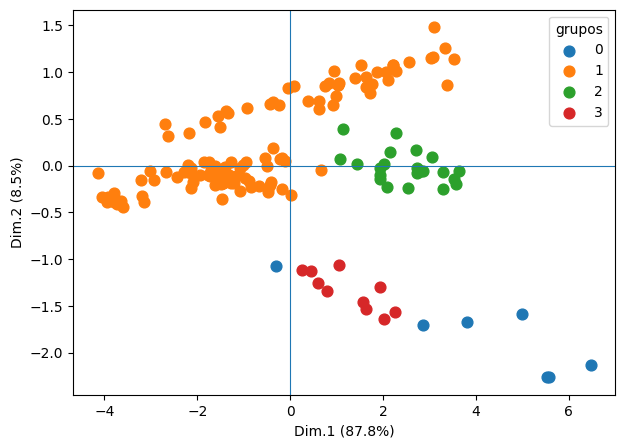

In [20]:
# Gráfico
acp = PCA(n_components=2)
coord = acp.fit_transform(datos)

plot_dbs = pd.DataFrame({
    "Dim.1": coord[:, 0],
    "Dim.2": coord[:, 1],
    "grupos": grupos
})

plt.figure(figsize=(7, 5))

for g in sorted(plot_dbs["grupos"].unique()):
    temp = plot_dbs[plot_dbs["grupos"] == g]
    plt.scatter(temp["Dim.1"], temp["Dim.2"], label=str(g), s=60)

plt.axhline(0, linewidth=0.8)
plt.axvline(0, linewidth=0.8)
plt.xlabel(f"Dim.1 ({acp.explained_variance_ratio_[0]*100:.1f}%)")
plt.ylabel(f"Dim.2 ({acp.explained_variance_ratio_[1]*100:.1f}%)")
plt.legend(title="grupos")
plt.show()

In [21]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score

# Estadísticas de validación

# Recodificar ruido para cluster.stats()
grupos_cs = grupos.copy()

if np.any(grupos_cs == 0):
    grupos_cs[grupos_cs == 0] = grupos_cs.max() + 1

val_avg_silwidth = silhouette_score(D, grupos_cs, metric="precomputed")

clusters = np.unique(grupos_cs)

diametros = []
separaciones = []

for g in clusters:
    idx = grupos_cs == g
    diametros.append(D[np.ix_(idx, idx)].max())

for i, g1 in enumerate(clusters):
    for g2 in clusters[(i + 1):]:
        idx1 = grupos_cs == g1
        idx2 = grupos_cs == g2
        separaciones.append(D[np.ix_(idx1, idx2)].min())

val_dunn = min(separaciones) / max(diametros)

val_ch = calinski_harabasz_score(datos, grupos_cs)

print(val_avg_silwidth) # silueta promedio, maximizar
print(val_dunn)         # índice de Dunn, maximizar
print(val_ch)           # Calinski-Harabasz, maximizar

0.24992204794866274
0.07250992489384928
39.356553152522004
